주피터 노트북은 + GPU Server로 돌림.  
cuda는 전통적으로 CPU가 처리하던 응용 프로그램의 계산을 GPu로 병렬처리 하도록 해주는 기술의 일종이다.

Nvidia
딥러닝 기반 기술들은 거의 다 엔비디아 GPU사용한다.  
CUDA는 엔비디아에서 지원하는 GPU소프트 웨어이다.

#0. Module import

In [1]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

#1. Device 설정

In [2]:
device = torch.device('cuda' if torch.cuda.is_available else 'cpu') 
device

device(type='cuda')

#2. Hyper Parameters

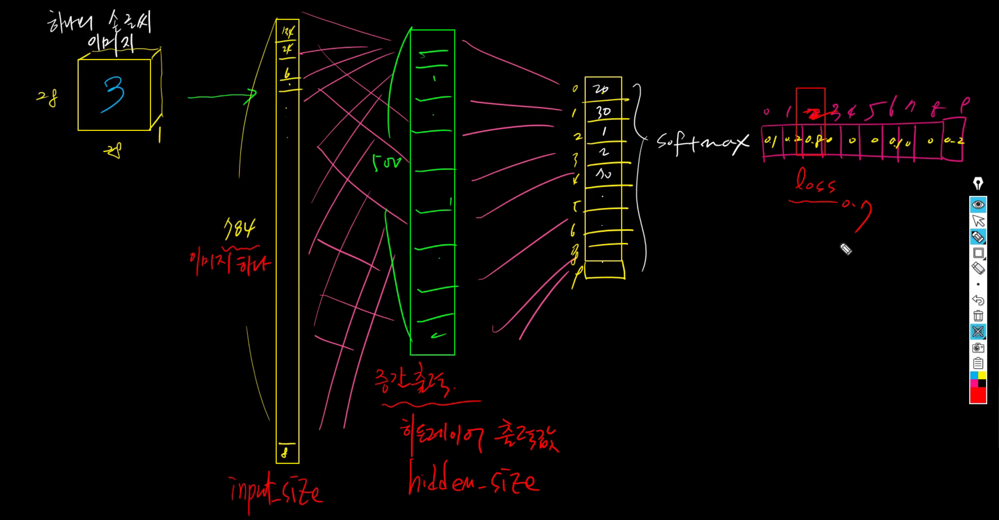

위의 loss값의 0.7은 인덱스 9의 20%를 의미한다.| 

In [3]:
input_size = 784 # 28x28 이므로 곱한 값이 들어간다
hidden_size = 500 # 중간출력, 히든레이어의 출력값이 hidden_size가 된다.
num_classes = 10 # 마지막에 출력되는 아웃풋을 말한다.
num_epochs = 5 
batch_size = 100 # 60000장의 갯수를 100개씩 로딩 시킨다. 그럼 총 600번 학습이 진행된다.
learning_rate = 0.001 

#3. Load and Save Data

In [4]:
# transform으로 매개변수를 써줘야한다.
train_dataset = torchvision.datasets.MNIST(root= '../../data',
                                           train=True,
                                           transform=transforms.ToTensor(),
                                           download=True)
# test의 데이터를 뽑아올때는 train=False와 download는 한번만 된다는걸 기억하자.
test_dataset = torchvision.datasets.MNIST(root= '../../data',
                                           train=False,
                                           transform=transforms.ToTensor())

#4. Make Loader

In [5]:
# DataLoader는 C++로 코딩되어있음...
train_loader = torch.utils.data.DataLoader(dataset = train_dataset, # 6만개
                                     batch_size = batch_size, # batch size가 100 으로 지정 이렇게 하면 100개씩 600개가 저장되어있음.
                                     shuffle = True)

test_loader = torch.utils.data.DataLoader(dataset = test_dataset,
                                     batch_size = batch_size,
                                       shuffle=False)

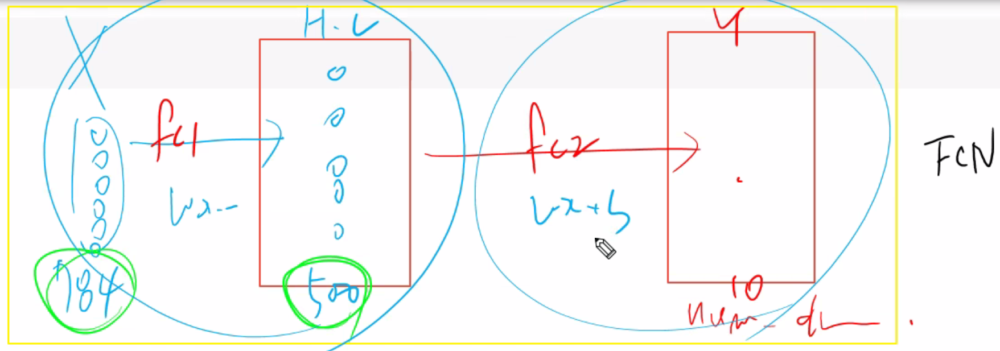

#5. Make Forward Propagation in NN class

In [6]:
class NeuralNet(nn.Module):
  def __init__(self, input_size, hidden_size, num_classes):
    super(NeuralNet,self).__init__()
    self.fc1=nn.Linear(input_size, hidden_size) # (인풋, 아웃풋)
    # ReLU넣기 중간 출력값 나오기전에
    self.relu = nn.ReLU()
    self.fc2=nn.Linear(hidden_size,num_classes) # (인풋, 아웃풋)

  def forward(self, x):
    out = self.fc1(x)
    out = self.relu(out)
    out = self.fc2(out)
    return out

#6. Model Generation and Define loss_Funtion, optimizer 

In [7]:
# 모델 클래스를 생성... 이 모델을 GPU 서버에서 돌릴것이다.
model = NeuralNet(input_size, hidden_size, num_classes).to(device)
loss_function = nn.CrossEntropyLoss() ## 여기안에 softmax함수와 -log(x) R(x)가 내장되어있다.
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate) # SGD대신 이번엔 Adam으로 테스트 해볼것이다. model.parameters()은 w,b를 해킹하고 있다.

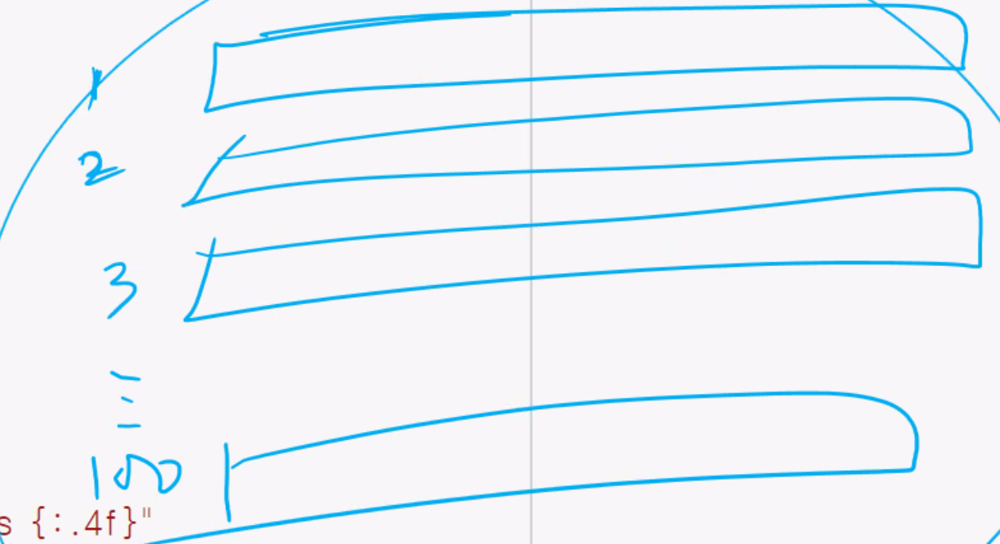

#7. Learn the model, override weights and bias values

In [8]:
total_step = len(train_loader)
total_step # 600 = 60000/batch_size 이므로 

600

In [10]:
for epoch in range(num_epochs): # epoch수 만큼, for문을 돌려준다. = 5
  for i, (images, labels) in enumerate(train_loader): # 600개로 100개씩 들어간다. 기본 구조는 (100 x 1 x 28 x 28) 로 4차원 구성되어있다.

    # 1. 받아오는 이미지 연산하기 위해 (100, 784)의 형태로 만들어 준다
    images = images.reshape(-1, 28*28).to(device) # 이미지를 1차원으로 reshape을 해주는 부분이다. 함수의 파라미터에 -1이 들어가면 특별한 의미를 갖는데, 다른 나머지 차원 크기를 맞추고 남은 크기를 해당 차원에 할당해 준다는 의미입니다.
    labels = labels.to(device)

    # 2. 100개의 image를 모델에 넣어서 output 변수로 prediction(예측값)값을 가져온다.
    outputs = model(images) # 한줄로 펼친 값이 모델에 100개가 들어감.

    # 3, loss_function에 넣어서 모델의 사진 마다의 loss값을 추출한다.
    loss = loss_function(outputs, labels) # batch_size가 100개에 대한 loss값 100개 가 나온다.
    
    # 4. optimizer을 사용하기위하여 초기화를 시켜준다. 또한 위에 선언된 Adam방법을 가지고 계산을 시작할 준비를 한다.
    optimizer.zero_grad()

    # 5. loss위 3번에서 추출된 loss값을 back Propagation으로 W값과 bias값을 재 선언해준다.
    loss.backward() # backward 함수는 autograd 를 사용하여 자동으로 정의된다.

    # 6. 위의 5번에서 재선언된 loss값을 가지고 step을 밟아 경사하강을 진행한다. 즉, Adam Gradient descent의 연산으로 경사하강한다.
    optimizer.step() # 재선언된 W와 b를 매개변수로 받고 있으므로, 위의 5번에서 재 선언된 w와 b를 가지고 연산해서 하강하게된다.

    # 7. loss값을 잘 알아보기 위해서 epoch마다 print해본다. 
    if (i+1)% 100 == 0:
      # print(loss.item())
      print(f'[{epoch+1}/{num_epochs}], Step[{i+1}/{total_step}], Loss[{loss.item():.4f}]')

[1/5], Step[100/600], Loss[0.3450]
[1/5], Step[200/600], Loss[0.2747]
[1/5], Step[300/600], Loss[0.3672]
[1/5], Step[400/600], Loss[0.1721]
[1/5], Step[500/600], Loss[0.1904]
[1/5], Step[600/600], Loss[0.0842]
[2/5], Step[100/600], Loss[0.1440]
[2/5], Step[200/600], Loss[0.1902]
[2/5], Step[300/600], Loss[0.1481]
[2/5], Step[400/600], Loss[0.2365]
[2/5], Step[500/600], Loss[0.0853]
[2/5], Step[600/600], Loss[0.0728]
[3/5], Step[100/600], Loss[0.1536]
[3/5], Step[200/600], Loss[0.0525]
[3/5], Step[300/600], Loss[0.0649]
[3/5], Step[400/600], Loss[0.0788]
[3/5], Step[500/600], Loss[0.0275]
[3/5], Step[600/600], Loss[0.0582]
[4/5], Step[100/600], Loss[0.0583]
[4/5], Step[200/600], Loss[0.2028]
[4/5], Step[300/600], Loss[0.0388]
[4/5], Step[400/600], Loss[0.0134]
[4/5], Step[500/600], Loss[0.0384]
[4/5], Step[600/600], Loss[0.0218]
[5/5], Step[100/600], Loss[0.0489]
[5/5], Step[200/600], Loss[0.0271]
[5/5], Step[300/600], Loss[0.0249]
[5/5], Step[400/600], Loss[0.0709]
[5/5], Step[500/600]

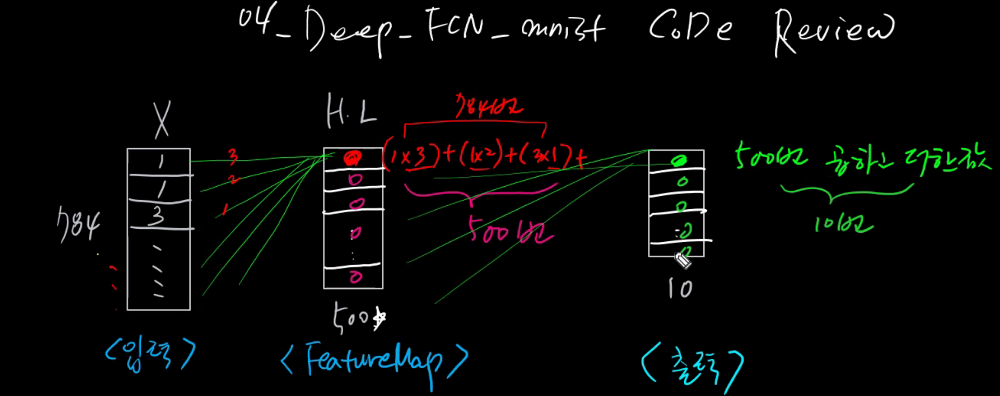

feature map에 500개의 값이 저장됨  
featrue map에 10개의 값이 저장됨.  
이 전체가 딱 1장의 이미지를 예측한 결과값이다.  
하지만 batch_size로 100장씩 로딩함... 그래서 이걸 x100주고 전체사진이니까 600개를 더해줘야한다.

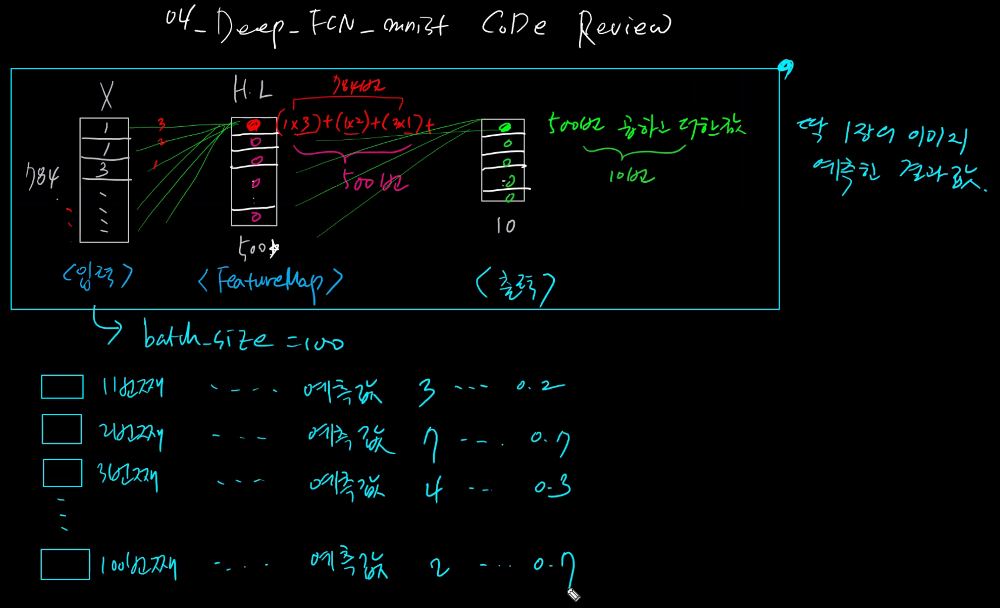

100번 로딩하고나서 학습을 진행한다.


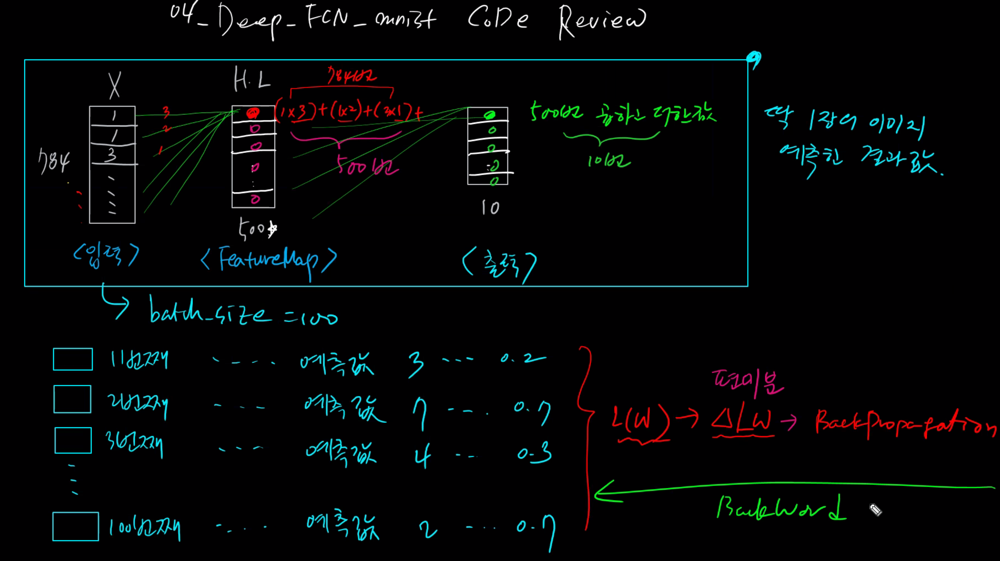

Backword 을 진행한다.

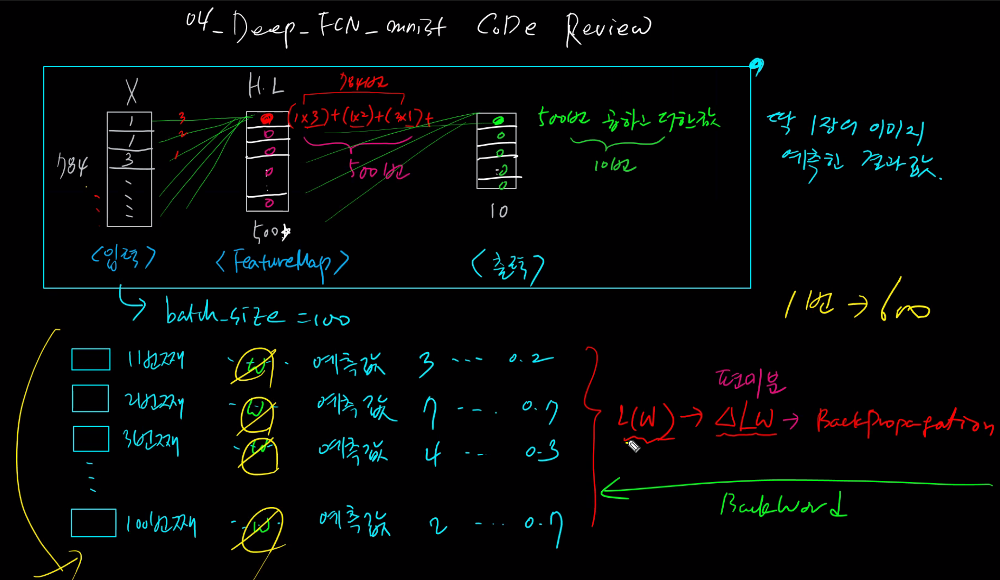

이 과정을 600번을 하고 난 결과가 1epoch이다.

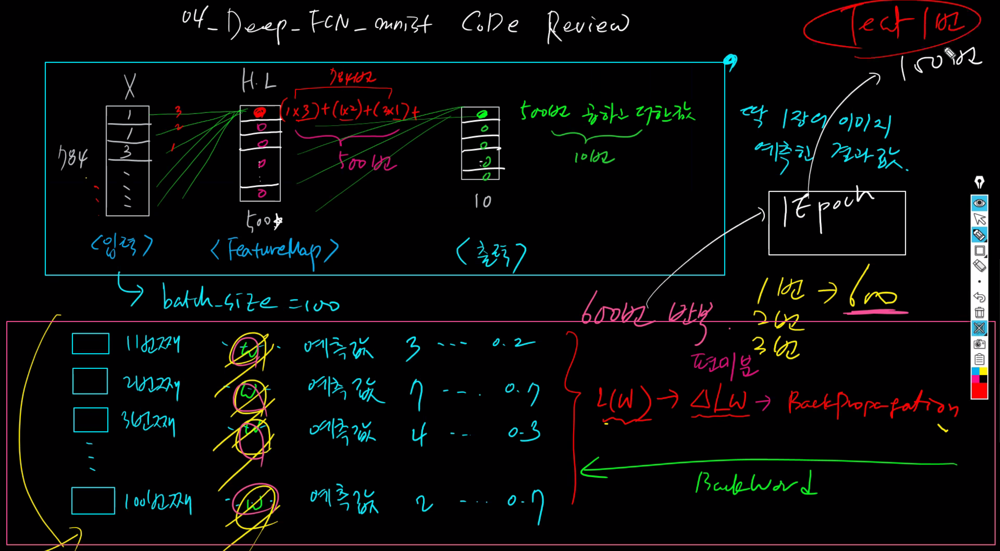

epoch만큼 5 이면 5번 100이면 100 다돌고 test를 하는 것이다.

#8. Model Test

In [14]:
# 1. torch의 내장함수 no_grad()를 사용해서 테스트 메모리 할당을 방지한다.

# no_grad() 함수를 사용함으로 학습을 안하겠다고 말 하는 것이다. 
# 실제로 학습할  필요가 없으면 이구문이 반드시 들어가야한다. 
# 이 구문을 안해주면, 실제로 backpropagation을 당장 안하더라도 backpropagation을 하기위한 메모리를 확보한다.
# 메모리를 빼먹지 않기 위해서 반드시 추가해야하는 구문이다.
# with torch.grad_enabled() 함수 또한 같은 뜻으로 사용하는 함수이다.
# 이것을 사용안하면 엄청난 메모리를 할당하게 된다.
with torch.no_grad():
  correct = 0
  total = 0

  # 2. test_loader변수에 저장된 X_test, y_test를 가져온다. 
  for images, labels in test_loader: # 굳이 인덱스를 안 받아도 되기때문에 그냥 사용한다.

    # 3. 이미지를 연산작업 하기위해서 100x784의 형태로 reshape 시켜준다.
    images = images.reshape(-1, 28*28).to(device)
    labels = labels.to(device)

    # 4. 모델에 테스트 이미지를 넣어서 prediction score(예측값)을 받아온다.
    outputs = model(images)
    # torch.max()함수는 주어진 텐서 배열의 최대 값이 들어있는 index를 리턴하는 함수입니다.
    # 뒤에 들어가는 1 은 dimension(차원)에 대한 것인데요, 우리는 64 * 10개의 Y_pred 값을 한번에 넣어주고  64개의 예측한 값을 받아와야 합니다.
    # 하지만 어떤 단위로 max값을 받아올 것인지 정해주지 않으면 그냥 max 함수는 전체의 640개의 element중 최대의 인덱스를 리턴하고 말 것입니다.   

    # 5. _(언더바)는 메모리 할당을 줄이기 위해서 메모리에 올리지 않는것을 말한다. 즉, index값이 해당 이미지의 라벨값이므로 비교를 위해서 가져옴 
    _, predicted_index = torch.max(outputs.data, 1)  # value, index의 값을 리턴한다. _는 저장하지 않을때 사용한다. (메모리 할당량을 감)

    total += labels.size(0)
    correct += (predicted_index == labels).sum().item()

print(f'Accuracy : {100*correct/total}')

print(labels.size(0)) # 리스트의 사이즈
print(labels) # 리스트
print(correct) # 맞은 갯수
torch.save(model.state_dict(), 'MNIST_Adam_Model.ckpt') # 데이터를 MNIST_Adam_Model.ckpt 의 이름으로 저장한다.

Accuracy : 98.07
100
tensor([8, 9, 0, 1, 2, 3, 4, 5, 6, 7, 8, 0, 1, 2, 3, 4, 7, 8, 9, 7, 8, 6, 4, 1,
        9, 3, 8, 4, 4, 7, 0, 1, 9, 2, 8, 7, 8, 2, 6, 0, 6, 5, 3, 3, 3, 9, 1, 4,
        0, 6, 1, 0, 0, 6, 2, 1, 1, 7, 7, 8, 4, 6, 0, 7, 0, 3, 6, 8, 7, 1, 5, 2,
        4, 9, 4, 3, 6, 4, 1, 7, 2, 6, 5, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 0, 1, 2,
        3, 4, 5, 6], device='cuda:0')
9807


torch.max()에 대한 설명이다.

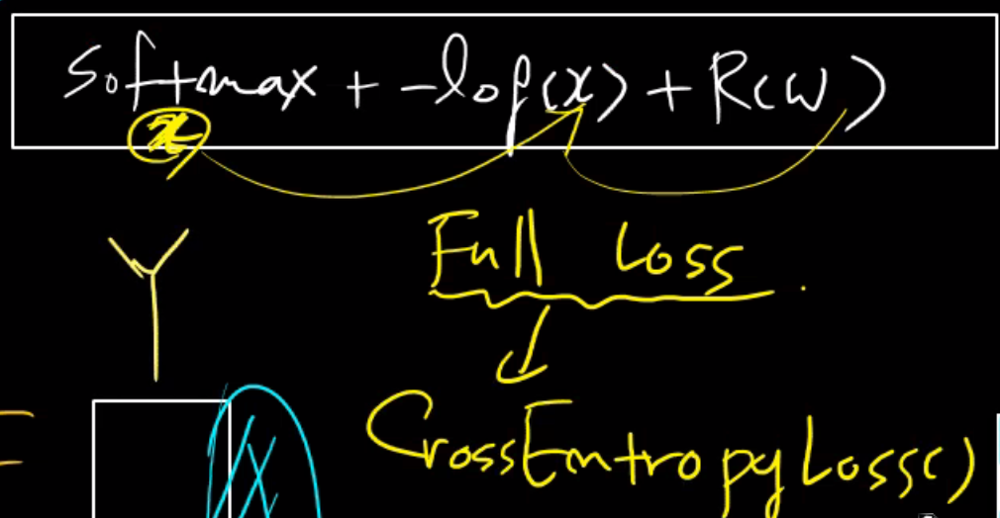

CrossEntropyLoss에 Softmax 함수가 있어서 자동으로 loss값을 계산해준다.

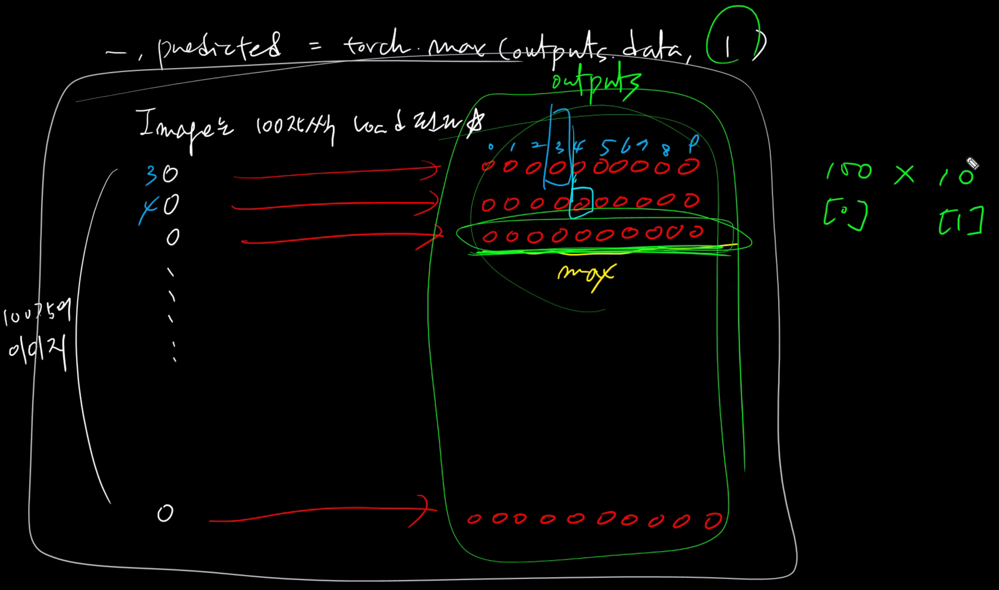

100x10이기때문에 1을 넣어야 한다.

In [15]:
images.shape # 위에서 reshape했기 때문에 784가 나옴.

torch.Size([100, 784])

tensor(9, device='cuda:0')


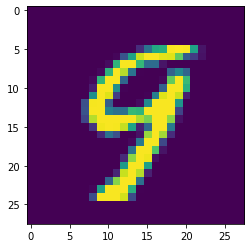

In [16]:
plt.imshow(images[1].cpu().numpy().reshape(28,28)) # 이미지를 볼땐 cpu로 바꿔서 numpy로 돌려야한다. reshape은 원래의 높이와 크기만큼 변형 시켜준다.

print(outputs[1].argmax())

In [17]:
outputs.shape

torch.Size([100, 10])

tensor(8, device='cuda:0')
tensor(9, device='cuda:0')
tensor(0, device='cuda:0')
tensor(1, device='cuda:0')
tensor(2, device='cuda:0')
tensor(3, device='cuda:0')
tensor(4, device='cuda:0')
tensor(5, device='cuda:0')
tensor(6, device='cuda:0')
tensor(7, device='cuda:0')


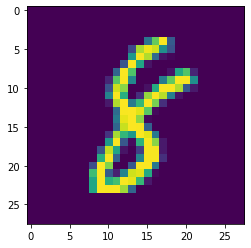

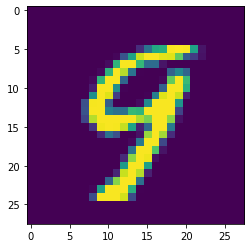

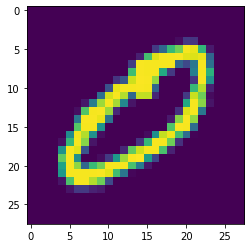

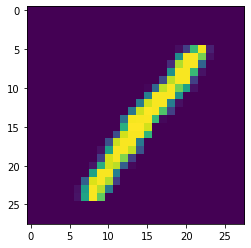

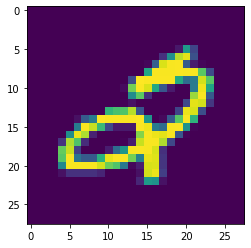

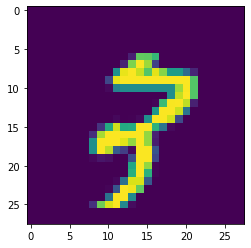

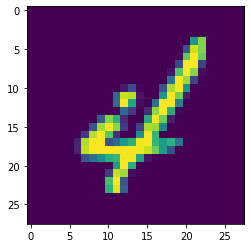

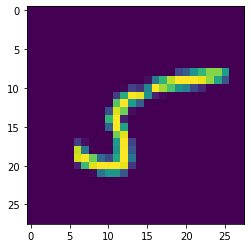

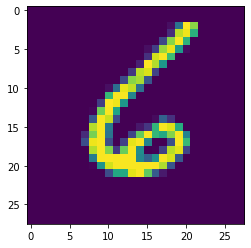

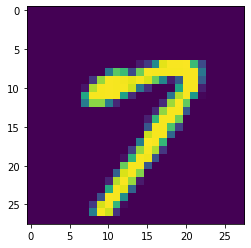

<Figure size 432x288 with 0 Axes>

In [18]:
# outputs의 결과에 맞는 이미지를 동시에 출력해서 비교해본다.
for i in range(10):
  plt.imshow(images[i].cpu().numpy().reshape(28,28))
  plt.figure()
  print(outputs[i].argmax())

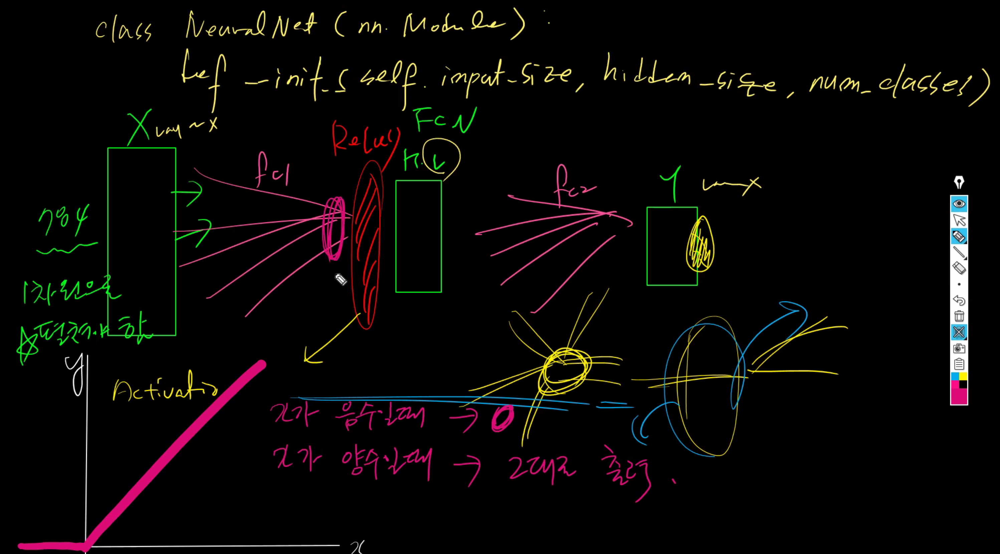

1.   항목 추가
2.   항목 추가

